Execute this cell to verify **GPU** access. If an error occurs, go to the toolbar, select Runtime, and switch the Runtime Type to one of the available GPU options.[link text](https://)

In [ ]:
!nvidia-smi

Mon Nov 27 12:35:22 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.105.17   Driver Version: 525.105.17   CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   32C    P8     9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

Optional: Mount **Google Drive** and get the current working directory.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

MessageError: ignored

Let's install **YOLO** from Ultralytics. The simplest method is using '**pip**'

Note: If you have a specific version of YOLO in mind, you can directly set the version. (e.g.  !pip install ultralytics==8.0.20) In some cases, that sounds more convenient and less risky in terms of any potential conflicts as well as unstable updates.


In [ ]:
# Install the ultralytics package (including YOLOv8) using pip
#!pip install ultralytics==8.0.20 --quiet
!pip install ultralytics
#import ultralytics
#ultralytics.checks()

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 645.9/645.9 kB 10.6 MB/s eta 0:00:00


Next, we'll import YOLO as well as a few handy libraries for later use.

In [ ]:
from ultralytics import YOLO
from matplotlib import image
from matplotlib import pyplot as plt
from PIL import Image
#from IPython import display
#display.clear_output()
#from IPython.display import display, Image
import glob
import random
import os
HOME = os.getcwd()

Now we're all set to use the YOLOv8 model for **predictions** on images and videos. This involves different types of predictions: **Detection** (to draw bounding boxes), **Segmentation** (to outline objects), **Tracking**, Image **Classification**, and Pose Detection. Our focus will be on Detection, Segmentation, and Tracking. You can view examples of these from the Ultralytics page (https://github.com/ultralytics/ultralytics).



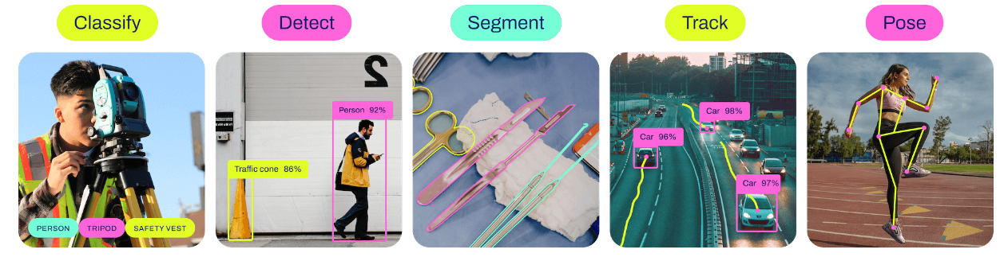


In the initial phase of our experiments, we utilize the original YOLOv8 models in their pre-trained state. This '**zero-shot**' manner involves using the models as they are, applying them to our images right away, without the need for further training or **fine-tuning**.

We're ready to have the machine analyze our image. On Colab, there are several methods to **upload images**. The simplest (but not the best!) is to locate the current working directory in Colab (using os.getcwd()), navigate there, and right-click to upload the image, as demonstrated in the following image.
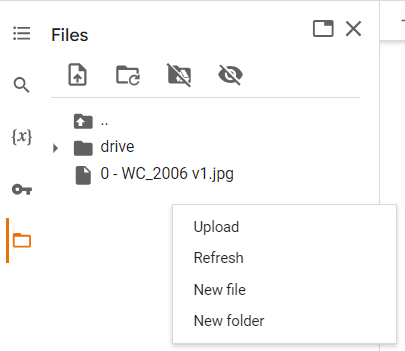

Alternatively, you can **upload your data to Google Drive** and then allow the machine to access it from there.

Unlike the previous method, storing your data on Google Drive ensures it won't be deleted once your session ends.







In [ ]:
# to get the current working directory
display(os.getcwd())

'/content'

In both cases, you can simply right-click on the image file and copy the path:

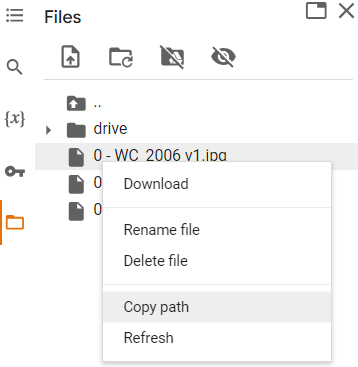

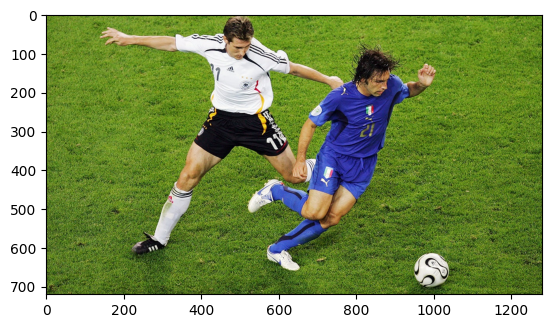

In [ ]:
Test_Image1 = '/content/0 - WC_2006 v1.jpg'
plt.imshow(image.imread(Test_Image1))
#Image(Test_Image1)

It's time to **load the pretrained YOLO models**. We'll be loading both the **detection** and **segmentation** models to compare the different results they produce.

In [ ]:
# pre-trained model for detection
model_detection = YOLO('yolov8n.pt')
# pre-trained model for segmentation
model_segmentation = YOLO('yolov8n-seg.pt')

100%|██████████| 6.23M/6.23M [00:00<00:00, 78.0MB/s]


100%|██████████| 6.73M/6.73M [00:00<00:00, 80.0MB/s]


-----------------------------------------------------------



Now it's time to **Predict**!

Here that means **Detection** & **Segmentation**

-----------------------------------------------------------

In [ ]:
prediction_detection = model_detection.predict(Test_Image1)
prediction_segmentation = model_segmentation.predict(Test_Image1)


image 1/1 /content/0 - WC_2006 v1.jpg: 384x640 2 persons, 1 sports ball, 292.7ms
Speed: 12.9ms preprocess, 292.7ms inference, 48.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /content/0 - WC_2006 v1.jpg: 384x640 2 persons, 1 sports ball, 100.5ms
Speed: 2.1ms preprocess, 100.5ms inference, 12.6ms postprocess per image at shape (1, 3, 384, 640)


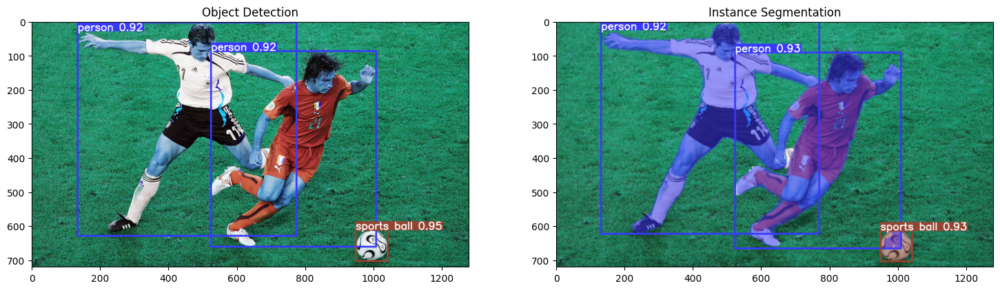

In [ ]:
detection_result_array = prediction_detection[0].plot()
instance_result_array = prediction_segmentation[0].plot()
fig = plt.figure(figsize=(18, 9))
ax1 = fig.add_subplot(1,2,1)
ax1.set_title("Object Detection")
ax1.imshow(detection_result_array)
ax2 = fig.add_subplot(1,2,2)
ax2.set_title("Instance Segmentation")
ax2.imshow(instance_result_array)

Alternatively, and in order to have higher control on parameters such as confidence level, you can run the models via **CLI (Command Line Interface)**.

This can be done by: **yolo mode=predict** comand:

In [ ]:
!yolo task=detect mode=predict model=yolov8n.pt conf=0.25 source='/content/0 - WC_2006 v1.jpg' save=True

Ultralytics YOLOv8.0.219 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8n summary (fused): 168 layers, 3151904 parameters, 0 gradients, 8.7 GFLOPs

image 1/1 /content/0 - WC_2006 v1.jpg: 384x640 2 persons, 1 sports ball, 99.3ms
Speed: 2.0ms preprocess, 99.3ms inference, 83.2ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs/detect/predict
💡 Learn more at https://docs.ultralytics.com/modes/predict


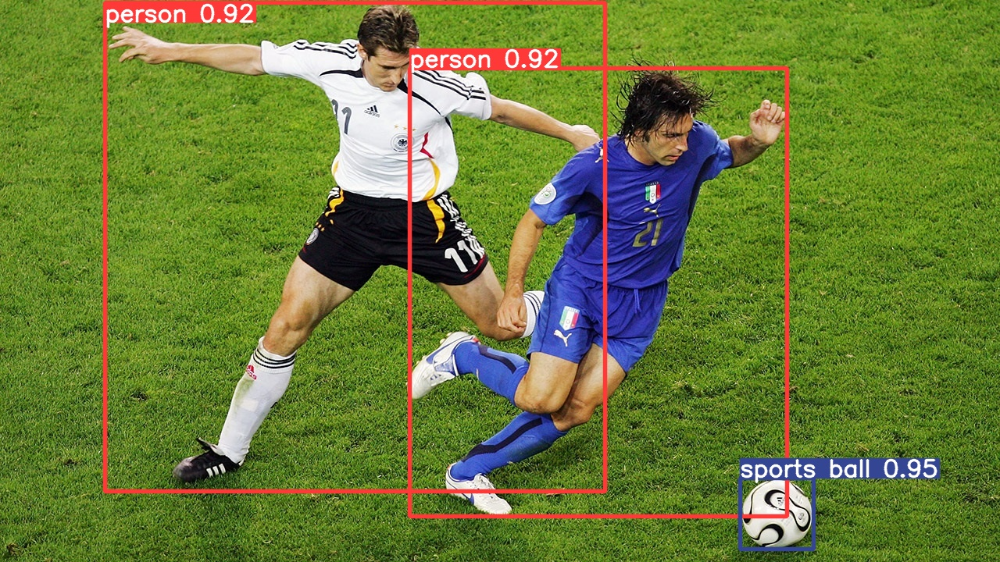

In [ ]:
# To visualize the result
# Note: The path is hard-coded here, make sure you give the actual address to the folder containing the predicted results:
from IPython.display import display, Image

Image('/content/runs/detect/predict/0 - WC_2006 v1.jpg')

Alternatively, you can show the prediction result right away by enabling the **show** argument. Another reason to work with CLI!

Note: It may not visualize the output in case there are issues with graphical display environment (like QT error, Display error, CUDA, etc.)

In [ ]:
#!yolo task=detect mode=predict model=yolov8n.pt conf=0.25 source='/content/0 - WC_2006 v1.jpg' show=True

**`bold text`**If everything is set up correctly, you should see predictions like this:

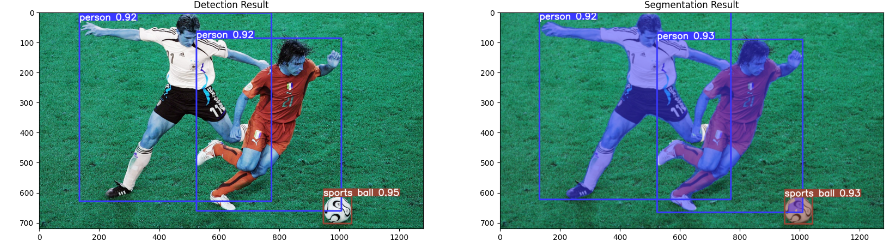

Note that, the pretrained YOLO models, already trained on a vast amount of data, can successfully detect and segment common objects such as people, balls, cats, dogs, and so on. Now, let's test it with another image (this time a .png) that includes two additional objects: a running dog and a plane, superimposed on the original image!


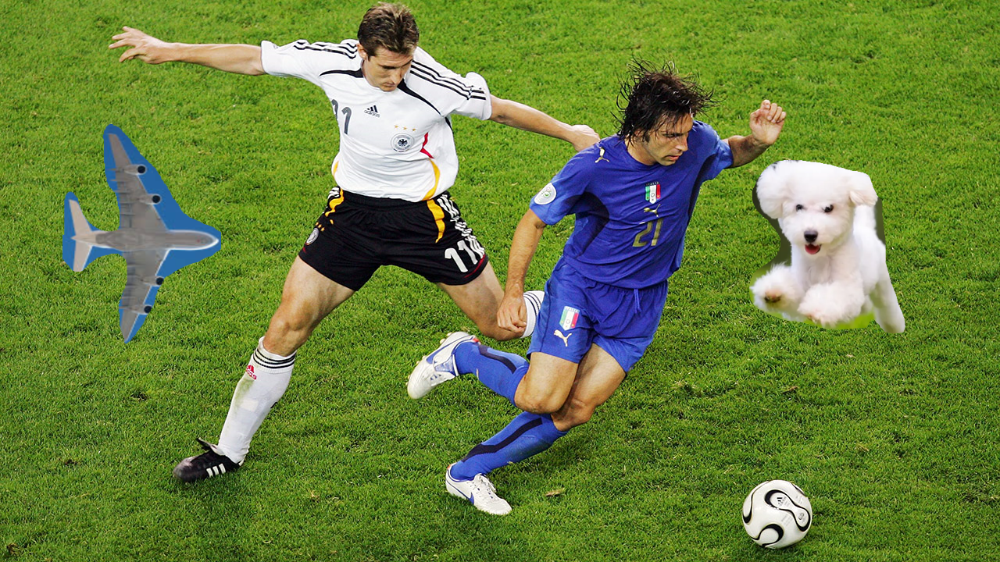

In [ ]:
Test_Image2 = '/content/0 - WC_2006 v2.png'
Image(Test_Image2)


image 1/1 /content/0 - WC_2006 v2.png: 384x640 2 persons, 1 dog, 1 sports ball, 1 kite, 11.2ms
Speed: 2.2ms preprocess, 11.2ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /content/0 - WC_2006 v2.png: 384x640 2 persons, 1 dog, 1 sports ball, 11.4ms
Speed: 2.1ms preprocess, 11.4ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)


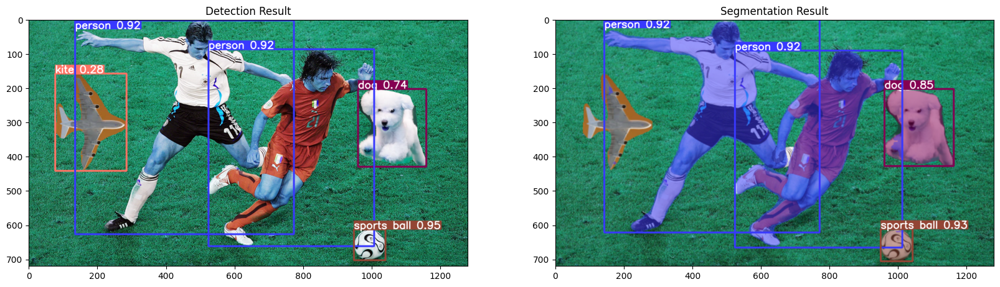

In [ ]:
# run the same models:
prediction_detection = model_detection.predict(Test_Image2)
prediction_segmentation = model_segmentation.predict(Test_Image2)
result_array=[]
result_array.append(prediction_detection[0].plot())
result_array.append(prediction_segmentation[0].plot())
fig = plt.figure(figsize=(20, 10))
ax1 = fig.add_subplot(1,2,1); ax1.set_title("Detection Result"); ax1.imshow(result_array[0] )
ax2 = fig.add_subplot(1,2,2); ax2.set_title("Segmentation Result"); ax2.imshow(result_array[1] )

The pre-trained models accurately detected and labeled the adorable dog! However, they misidentified the plane as a kite, which is an understandable mistake given their similarities in the context of certain images.


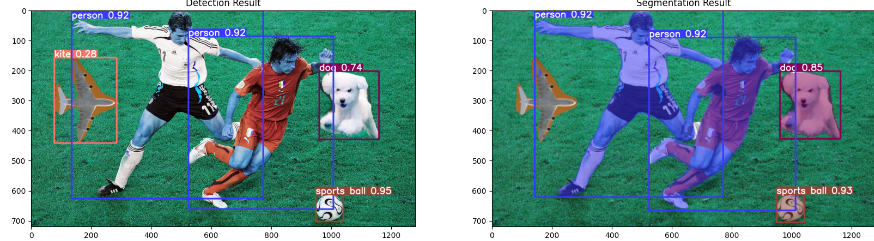

But what happens if we introduce biological structures into the image? Let's put it to the test!

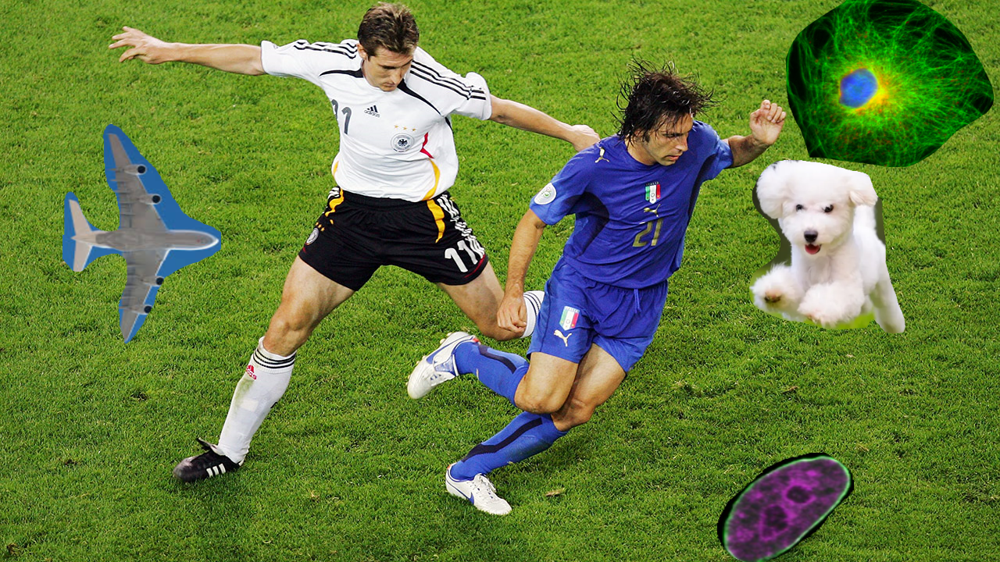

In [ ]:
Test_Image3 = '/content/0 - WC_2006 v3.png'
Image(Test_Image3)


image 1/1 /content/0 - WC_2006 v3.png: 384x640 2 persons, 1 dog, 1 frisbee, 1 sports ball, 1 kite, 8.3ms
Speed: 1.9ms preprocess, 8.3ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /content/0 - WC_2006 v3.png: 384x640 2 persons, 1 dog, 1 frisbee, 1 sports ball, 8.1ms
Speed: 1.7ms preprocess, 8.1ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)


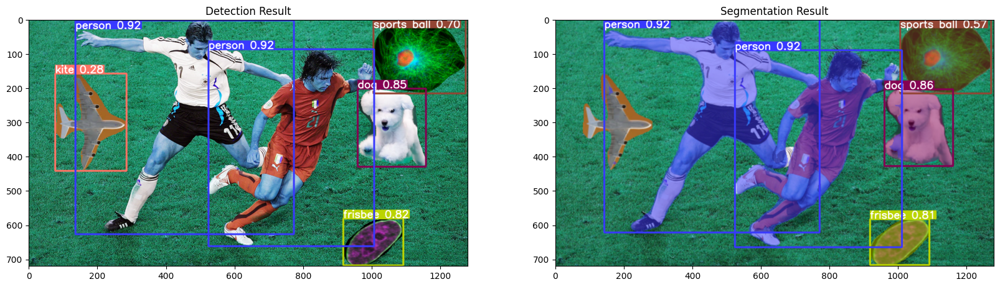

In [ ]:
# run the same models:
prediction_detection = model_detection.predict(Test_Image3)
prediction_segmentation = model_segmentation.predict(Test_Image3)
result_array=[]
result_array.append(prediction_detection[0].plot())
result_array.append(prediction_segmentation[0].plot())
fig = plt.figure(figsize=(20, 10))
ax1 = fig.add_subplot(1,2,1); ax1.set_title("Detection Result"); ax1.imshow(result_array[0] )
ax2 = fig.add_subplot(1,2,2); ax2.set_title("Segmentation Result"); ax2.imshow(result_array[1] )

The identification of biological structures as a frisbee and sports ball is certainly a case of **misidentification**. This is anticipated, as the YOLO models have NOT been exposed to anything beyond everyday objects. Now is the moment when we need to **further train (fine-tune) the model** using our **annotated data**' instead of relying on zero-shot learning.







Let's work on a "real" microscopy image!


image 1/1 /content/Substack-0001.png: 640x640 (no detections), 11.1ms
Speed: 5.1ms preprocess, 11.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/Substack-0001.png: 640x640 1 cake, 13.2ms
Speed: 4.7ms preprocess, 13.2ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


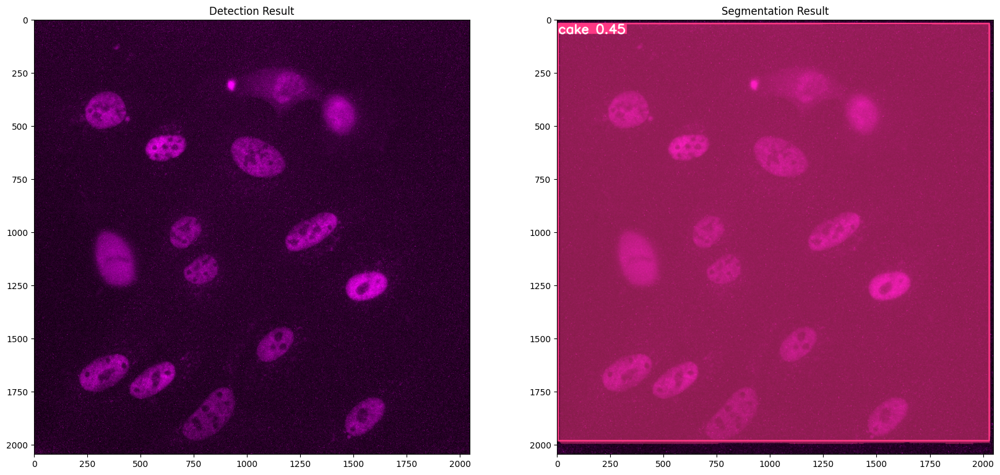

In [ ]:
Test_Image4 = '/content/Substack-0001.png'
#Image(Test_Image4)
# run the same models:
prediction_detection = model_detection.predict(Test_Image4)
prediction_segmentation = model_segmentation.predict(Test_Image4)
result_array=[]
result_array.append(prediction_detection[0].plot())
result_array.append(prediction_segmentation[0].plot())
fig = plt.figure(figsize=(20, 10))
ax1 = fig.add_subplot(1,2,1); ax1.set_title("Detection Result"); ax1.imshow(result_array[0] )
ax2 = fig.add_subplot(1,2,2); ax2.set_title("Segmentation Result"); ax2.imshow(result_array[1] )

Of course it's not a cake!!!
In order to teach the machine to recognize microscopy images containing cell nuclei, we should **train** the model firther (**fine-tune**) with a suitable **training dataset**. If we don't have a ready-made dataset, we need to create and **annotate training images**.

Various tools are available for annotating objects in images, and the choice often depends on the specific application. For instance, annotations for detection differ from those for segmentation. **Roboflow** [https://roboflow.com/] is one of the simplest but best annotation tools available. I have prepared a set of instructions in a PowerPoint file that will guide you through creating training samples. Once you've created a custom training dataset with Roboflow, all you need to do is copy and paste an '**API_KEY**' into the code below.

In [ ]:
!mkdir {HOME}/datasets
%cd {HOME}/datasets
!pip install roboflow --quiet

from roboflow import Roboflow
rf = Roboflow(api_key="XXXXXXXXXXXXXXX")
project = rf.workspace("agewers-30oij").project("cell-nuclei-detection")
dataset = project.version(1).download("yolov8")

display(dataset.location)
print(HOME)

/content/datasets
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.3/63.3 kB 1.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 8.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 8.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 12.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 7.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.2/72.2 kB 8.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 6.3 MB/s eta 0:00:00
loading Roboflow workspace...
loading Roboflow project...
Dependency ultralytics==8.0.196 is required but found version=8.0.215, to fix: `pip install ultralytics==8.0.196`



Extracting Dataset Version Zip to Cell-Nuclei-Detection-1 in yolov8:: 100%|██████████| 86/86 [00:00<00:00, 6477.22it/s]


'/content/datasets/Cell-Nuclei-Detection-1'

/content


The **Training Dataset** has been imported from RoboFlow could repository. You can access the train, validation, and test images under the folder **' /datasets/ '**. More information about the datasets can be found in the file ' **data.yaml** '.

Now it's time for **Training**!

*Note1:* We start with a YOLOv8 model version named '**yolov8s.pt**' that is the 'small' version of YOLOv8 for object detection. Feel free to try the other less-complex (i.e. yolov8n.pt) or more-complex (i.e. yolov8m.pt , yolov8l.pt and yolov8x.pt) YOLO models. Here you will find the differences between these **pre-trained YOLOv8 Detection models**:

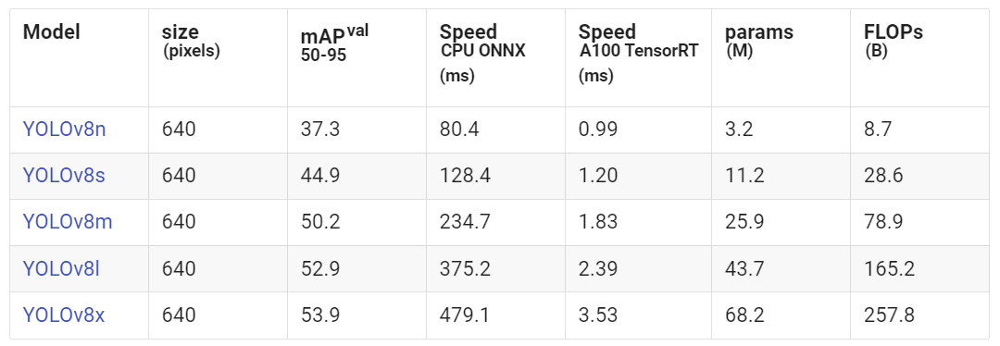

*Note2:* Feel free to play with **training parameters & settings** such as the number of epochs, image size, etc.

*Note3:* For some versions of YOLOv8, you may get an error stating that the model cannot find the train and validation folders. To fix this, you need to open hte **data.yaml** file and slightly modify it:

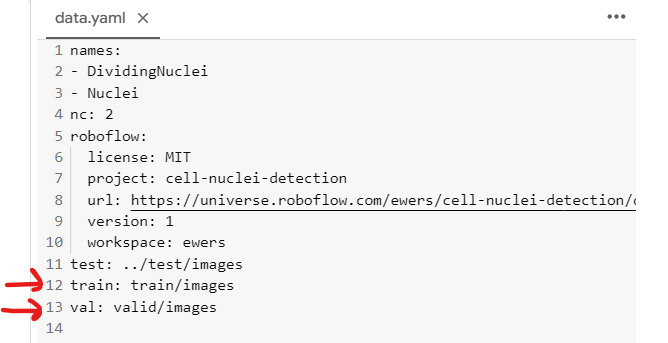

In [ ]:
{dataset.location}

{'/content/datasets/Cell-Nuclei-Detection-1'}

In [ ]:
%cd {HOME}

!yolo task=detect mode=train model=yolov8n.pt data={dataset.location}/data.yaml epochs=60 plots=True

/content
Ultralytics YOLOv8.0.215 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/datasets/Cell-Nuclei-Detection-1/data.yaml, epochs=60, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train3, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, fo

To check the **trained models**, find them under ** /runs/detect/trainX/ **

the best and last weights of the trained models can be found under the ** /weights/ ** folder. They're named as 'best.pt' and 'last.pt'.

To check the prediction results on the 'validation' portion of your dataset, double click on the image named 'val_batch0_pred.jpg'. You can compare the results with the expected one (i.e. groundtruth) by clicking on the image named 'val_batch0_labels.jpg'.

The 'learning curves' are saved as 'results.png'.

---------------------------------

Now let's upload new 'test' images, and run our trained model on it. The test images should be unseen to the model (should not taken from the training set).

To do so, we may create a new folder: 'TestFolder'. This folder could be created anywhere in your working directory, including your desired Google Drive folder. After creating the test folder, put some test images in the folder.

--------------------------------







Now we can run our trained model on the test images. To do this, you need to introduce both your **test data** and the **trained model** to the machine.
For the model, you can use the '**best.pt**' file, which usually contains the model parameters that performed best during training, or the '**last.pt**' file, which contains the parameters from the final training epoch.
You can specify the model by copying the path to either the 'best.pt' or 'last.pt' file into your code. The 'best.pt' is generally preferred due to its potentially better performance.

For the prediction part, it's advisable to experiment with different values for the **conf parameter**, which represents the confidence threshold for the model's predictions. Adjusting this value can alter the balance between precision and recall. A lower conf value might result in more predictions with increased chances of false positives, while a higher value could lead to fewer, but more accurate predictions. Feel free to test different settings to find the optimal threshold that best suits your images.

In [ ]:
# Note: it is hard-coded here. Update the folders containing your test files and model waights.

# quantitative validation on unseen test data
#!yolo task=detect mode=val model={HOME}/runs/detect/train/weights/best.pt data='/content/Substack-0001.png'

# prediction on unseen test data
!yolo task=detect mode=predict model={HOME}/runs/detect/train3/weights/best.pt conf=0.03 source='/content/Substack-0001.png' save=True

Ultralytics YOLOv8.0.215 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3006038 parameters, 0 gradients, 8.1 GFLOPs

image 1/1 /content/Substack-0001.png: 640x640 2 DividingNucleis, 13 Nucleis, 10.3ms
Speed: 5.1ms preprocess, 10.3ms inference, 92.1ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict7
💡 Learn more at https://docs.ultralytics.com/modes/predict


`Prediction` results are saved to ' **runs/detect/predictX** '

Here is a sample output:
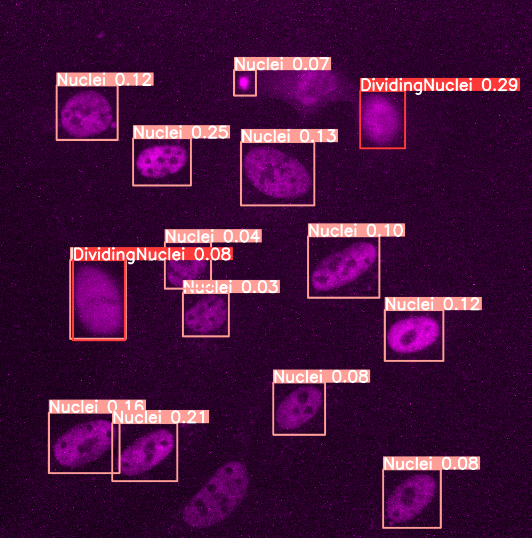